In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

path = r'C:\PythonProject\PythonCoreCourse\PythonDataSience\project\internet_service_churn.csv'
data = pd.read_csv(path)
data.head()

,id,is_tv_subscriber,is_movie_package_subscriber,subscription_age,bill_avg,reamining_contract,service_failure_count,download_avg,upload_avg,download_over_limit,churn
0,15,1,0,11.95,25,0.14,0,8.4,2.3,0,0
1,18,0,0,8.22,0,NaN,0,0.0,0.0,0,1
2,23,1,0,8.91,16,0.00,0,13.7,0.9,0,1
3,27,0,0,6.87,21,NaN,1,0.0,0.0,0,1
4,34,0,0,6.39,0,NaN,0,0.0,0.0,0,1


In [3]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 72274 entries, 0 to 72273
Data columns (total 11 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   id                           72274 non-null  int64  
 1   is_tv_subscriber             72274 non-null  int64  
 2   is_movie_package_subscriber  72274 non-null  int64  
 3   subscription_age             72274 non-null  float64
 4   bill_avg                     72274 non-null  int64  
 5   reamining_contract           50702 non-null  float64
 6   service_failure_count        72274 non-null  int64  
 7   download_avg                 71893 non-null  float64
 8   upload_avg                   71893 non-null  float64
 9   download_over_limit          72274 non-null  int64  
 10  churn                        72274 non-null  int64  
dtypes: float64(4), int64(7)
memory usage: 6.1 MB


In [4]:
data.isnull().sum()

id                                 0
is_tv_subscriber                   0
is_movie_package_subscriber        0
subscription_age                   0
bill_avg                           0
reamining_contract             21572
service_failure_count              0
download_avg                     381
upload_avg                       381
download_over_limit                0
churn                              0
dtype: int64

In [5]:
data.describe()

,id,is_tv_subscriber,is_movie_package_subscriber,subscription_age,bill_avg,reamining_contract,service_failure_count,download_avg,upload_avg,download_over_limit,churn
count,7.227400e+04,72274.000000,72274.000000,72274.000000,72274.000000,50702.000000,72274.000000,71893.000000,71893.000000,72274.000000,72274.000000
mean,8.463182e+05,0.815259,0.334629,2.450051,18.942483,0.716039,0.274234,43.689911,4.192076,0.207613,0.554141
std,4.891022e+05,0.388090,0.471864,2.034990,13.215386,0.697102,0.816621,63.405963,9.818896,0.997123,0.497064
min,1.500000e+01,0.000000,0.000000,-0.020000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,4.222165e+05,1.000000,0.000000,0.930000,13.000000,0.000000,0.000000,6.700000,0.500000,0.000000,0.000000
50%,8.477840e+05,1.000000,0.000000,1.980000,19.000000,0.570000,0.000000,27.800000,2.100000,0.000000,1.000000
75%,1.269562e+06,1.000000,1.000000,3.300000,22.000000,1.310000,0.000000,60.500000,4.800000,0.000000,1.000000
max,1.689744e+06,1.000000,1.000000,12.800000,406.000000,2.920000,19.000000,4415.200000,453.300000,7.000000,1.000000


In [6]:
data_mean = data.fillna({'reamining_contract':data['reamining_contract'].mean()}).dropna()
data_min = data.fillna({'reamining_contract':data['reamining_contract'].min()}).dropna()
data_mean.isnull().sum(), data_mean.info()

<class 'pandas.core.frame.DataFrame'>
Index: 71893 entries, 0 to 72273
Data columns (total 11 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   id                           71893 non-null  int64  
 1   is_tv_subscriber             71893 non-null  int64  
 2   is_movie_package_subscriber  71893 non-null  int64  
 3   subscription_age             71893 non-null  float64
 4   bill_avg                     71893 non-null  int64  
 5   reamining_contract           71893 non-null  float64
 6   service_failure_count        71893 non-null  int64  
 7   download_avg                 71893 non-null  float64
 8   upload_avg                   71893 non-null  float64
 9   download_over_limit          71893 non-null  int64  
 10  churn                        71893 non-null  int64  
dtypes: float64(4), int64(7)
memory usage: 6.6 MB


(id                             0
 is_tv_subscriber               0
 is_movie_package_subscriber    0
 subscription_age               0
 bill_avg                       0
 reamining_contract             0
 service_failure_count          0
 download_avg                   0
 upload_avg                     0
 download_over_limit            0
 churn                          0
 dtype: int64,
 None)

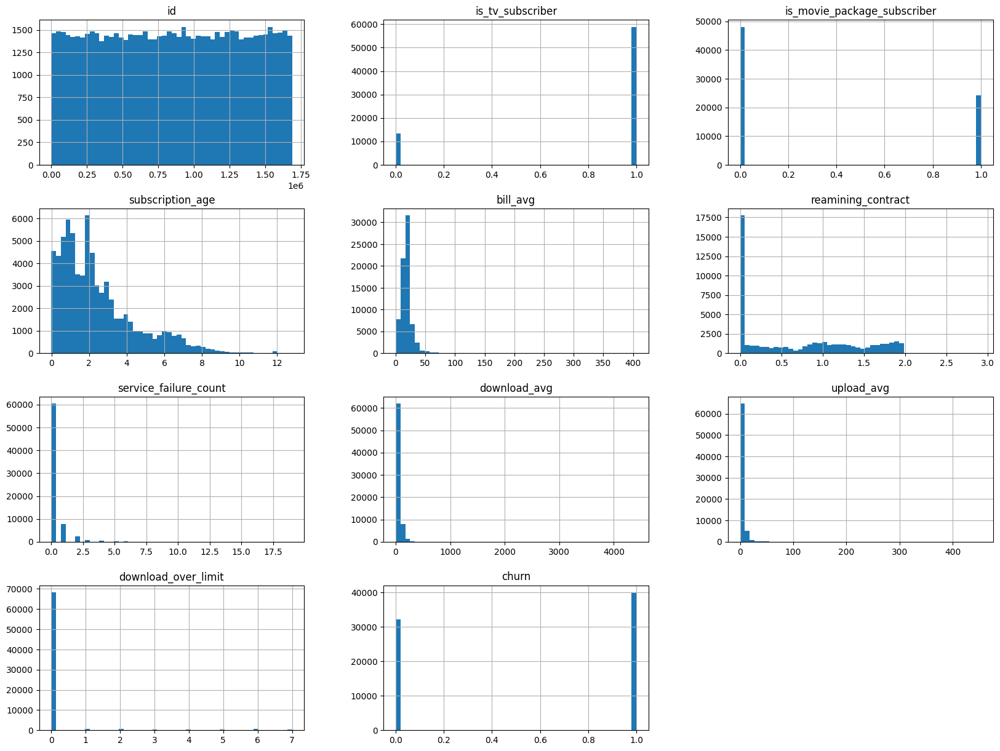

In [9]:
%matplotlib inline
data.hist(bins=50, figsize=(20,15))
plt.show()

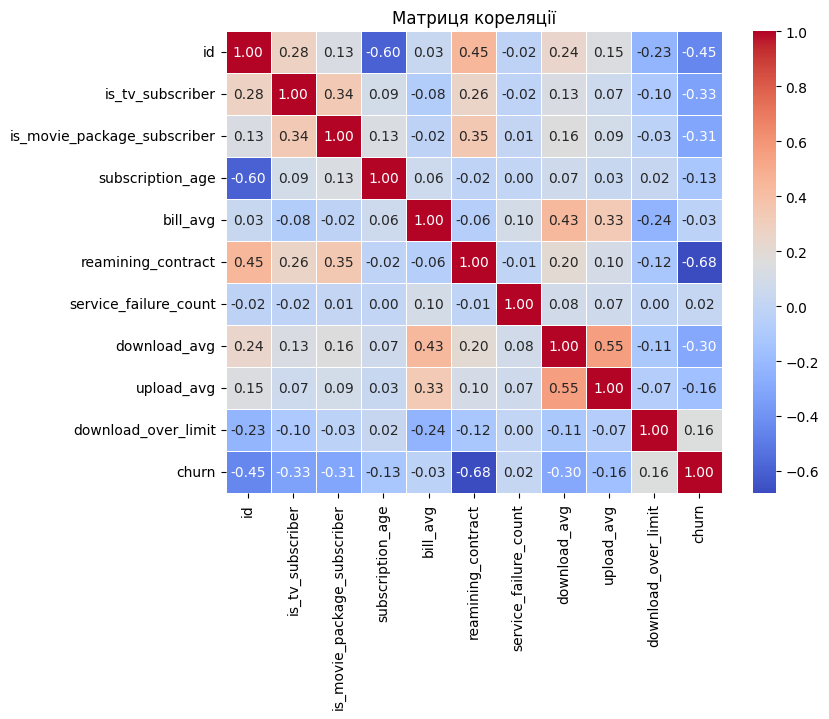

In [11]:
correlation_matrix = data_min.corr()

# Визуализируем матрицу корреляции с помощью тепловой карты
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, cmap='coolwarm', annot=True,  fmt='.2f', linewidths=0.5)
plt.title('Матриця кореляції')
plt.show()

In [11]:
data.groupby(by='churn').mean()

,id,is_tv_subscriber,is_movie_package_subscriber,subscription_age,bill_avg,reamining_contract,service_failure_count,download_avg,upload_avg,download_over_limit
churn,,,,,,,,,,
0,1.092310e+06,0.956989,0.496214,2.727828,19.252731,1.072765,0.254593,64.884728,5.983563,0.031622
1,6.483943e+05,0.701223,0.204619,2.226554,18.692859,0.183152,0.290037,26.838312,2.767698,0.349213


In [13]:
# відберемо фічи і таргет-колонку
X = data_min.iloc[:, 1:-1]
y = data_min.churn
X.head()

,is_tv_subscriber,is_movie_package_subscriber,subscription_age,bill_avg,reamining_contract,service_failure_count,download_avg,upload_avg,download_over_limit
0,1,0,11.95,25,0.14,0,8.4,2.3,0
1,0,0,8.22,0,0.00,0,0.0,0.0,0
2,1,0,8.91,16,0.00,0,13.7,0.9,0
3,0,0,6.87,21,0.00,1,0.0,0.0,0
4,0,0,6.39,0,0.00,0,0.0,0.0,0


In [14]:
# зробимо тренувальну і тестову вибірки даних, подивмось на їх розмірності для контролю
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((57514, 9), (14379, 9), (57514,), (14379,))

In [16]:
#порахуємо чи прям всі наші 21 парматр такі вже важливі, 
from sklearn.tree import DecisionTreeClassifier
tree_model = DecisionTreeClassifier(max_depth=6, min_samples_leaf=1)
tree_model.fit(X_train, y_train)

print(tree_model.score(X_train, y_train))
print(tree_model.score(X_test, y_test))

0.9400493792815662
0.9371305375895403


In [17]:
#та подивимось вагу кожного для нашого моделювання
from sklearn.tree import DecisionTreeClassifier
tree_model.feature_importances_

array([7.59216448e-04, 0.00000000e+00, 1.59422368e-02, 1.16059761e-02,
       9.06485325e-01, 0.00000000e+00, 6.38206060e-02, 1.07205952e-04,
       1.27943402e-03])

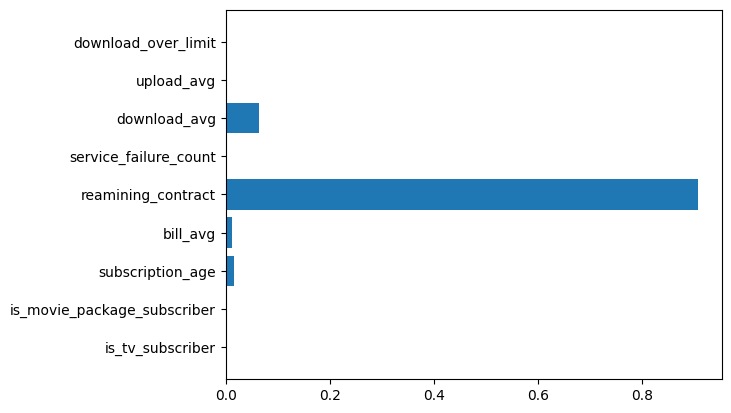

In [18]:
# візуалізуемо то наочно, і як бачимо зцифр і гістограми найцінніші вопше 2 , інші займають 1-1,5%
plt.barh(range(len(tree_model.feature_importances_)), tree_model.feature_importances_)
plt.yticks(range(len(X.columns)), X.columns)
plt.show()

In [23]:
# тож відкинемо зайві і залишимо 5, хоча можливо достатньо і двух, а леж ми хочемо найточніше. 
# оновимо датасет виливші зайве
important_features = ['reamining_contract', 'subscription_age', 'bill_avg', 'download_avg']
X_new = X[important_features]
X_new.head()

,reamining_contract,subscription_age,bill_avg,download_avg
0,0.14,11.95,25,8.4
1,0.00,8.22,0,0.0
2,0.00,8.91,16,13.7
3,0.00,6.87,21,0.0
4,0.00,6.39,0,0.0


NameError: name 'rf' is not defined

In [24]:
from sklearn.ensemble import RandomForestClassifier

# первизначимо тренувальну і тестову вибірку з оновленого датасету
X_train, X_test, y_train, y_test = train_test_split(X_new, y, test_size=0.2, random_state=42)
# створення Random Forest класифікатора
model = RandomForestClassifier(n_estimators=100, max_features=2, random_state=42)
# навчання моделі
model.fit(X_train, y_train)

# прогнозування на тестових даних
y_pred = model.predict(X_test)

In [25]:
model.score(X_train, y_train), model.score(X_test, y_test)

(0.9999130646451299, 0.9392169135544892)

In [26]:
# візуалізація дерева
from sklearn.tree import export_graphviz
import graphviz

dot_data = export_graphviz(
    model.estimators_[0], out_file=None, feature_names=X_new.columns,
    class_names=X_new.columns,
    filled=True, rounded=True, special_characters=True)

graph = graphviz.Source(dot_data)
graph.render("Відтік")
graph

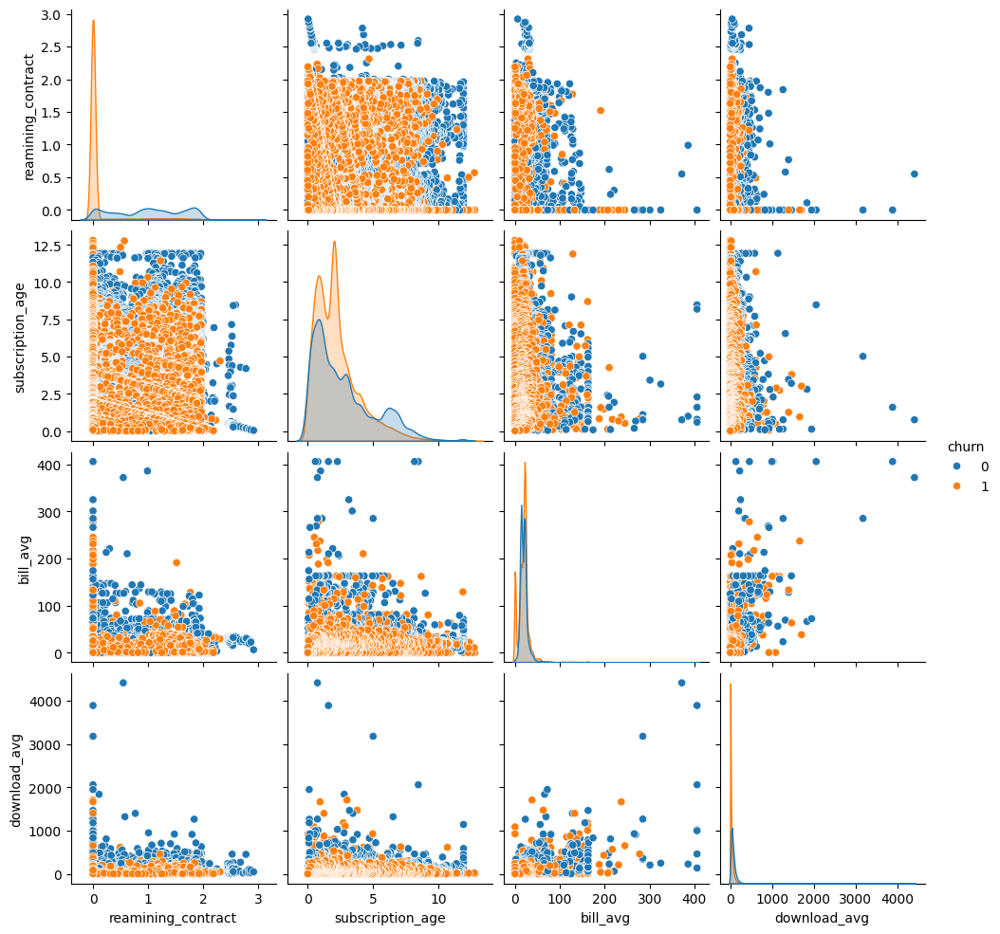

In [30]:
# на основі зменшеного датасету, зробимо візуаліцій залежності парметрів один від одгного, для розуміння а як приблизно розташовані наші дані
import seaborn as sns
important_features_all = ['reamining_contract', 'subscription_age', 'bill_avg', 'download_avg', 'churn']
df_new = data_min[important_features_all]
sns.pairplot(data=df_new, hue='churn')

In [32]:
# використаємо більш розширену кількість метрик для оцінки якості моделі
from sklearn. metrics import classification_report
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.92      0.94      0.93      6315
           1       0.95      0.94      0.95      8064

    accuracy                           0.94     14379
   macro avg       0.94      0.94      0.94     14379
weighted avg       0.94      0.94      0.94     14379



In [39]:
rf_accuracy, rf_precision, rf_recall, rf_f1, rf_roc_auc = evaluate_model(model, X_test, y_test)
print("Случайный лес:")
print(f"Точность: {rf_accuracy:.4f}, Полнота: {rf_recall:.4f}, F1-мера: {rf_f1:.4f}, ROC-AUC: {rf_roc_auc:.4f}")


Случайный лес:
Точность: 0.9392, Полнота: 0.9361, F1-мера: 0.9453, ROC-AUC: 0.9396


In [21]:
from sklearn.linear_model import LogisticRegression

In [22]:
# Инициализируем модели
logreg_model = LogisticRegression(random_state=42)
# зробимо тренувальну і тестову вибірки даних, подивмось на їх розмірності для контролю

X_log_train, X_log_test, y_log_train, y_log_test = train_test_split(X, y, test_size=0.2, random_state=42)
X_log_train.shape, X_log_test.shape, y_log_train.shape, y_log_test.shape


((57514, 9), (14379, 9), (57514,), (14379,))

In [23]:
logreg_model.fit(X_log_train, y_log_train)

C:\Users\Admin\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LogisticRegression(random_state=42)

In [24]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score

# Функция для оценки производительности модели
def evaluate_model(model, X_test, y_test):
    y_pred = model.predict(X_test)
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    roc_auc = roc_auc_score(y_test, y_pred)
    return accuracy, precision, recall, f1, roc_auc

In [25]:
# Оценка производительности моделей
logreg_accuracy, logreg_precision, logreg_recall, logreg_f1, logreg_roc_auc = evaluate_model(logreg_model, X_log_test, y_log_test)
print("Логистическая регрессия:")
print(f"Точность: {logreg_accuracy:.4f}, Полнота: {logreg_recall:.4f}, F1-мера: {logreg_f1:.4f}, ROC-AUC: {logreg_roc_auc:.4f}")


Логистическая регрессия:
Точность: 0.8751, Полнота: 0.9218, F1-мера: 0.8922, ROC-AUC: 0.8686


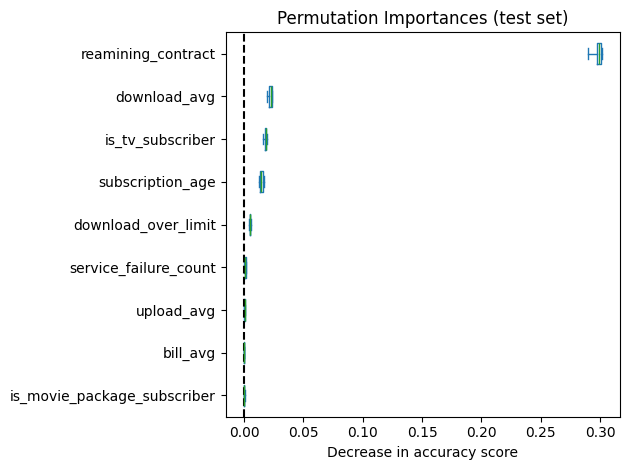

In [31]:
from sklearn.inspection import permutation_importance

result = permutation_importance(
    logreg_model, X_test, y_test, n_repeats=10, random_state=42, n_jobs=2
)

sorted_importances_idx = result.importances_mean.argsort()
importances = pd.DataFrame(
    result.importances[sorted_importances_idx].T,
    columns=X.columns[sorted_importances_idx],
)
ax = importances.plot.box(vert=False, whis=10)
ax.set_title("Permutation Importances (test set)")
ax.axvline(x=0, color="k", linestyle="--")
ax.set_xlabel("Decrease in accuracy score")
ax.figure.tight_layout()

In [32]:
result

{'importances_mean': array([1.81375617e-02, 3.47729327e-05, 1.45559496e-02, 3.47729327e-05,
        2.98094443e-01, 8.55414146e-04, 2.21781765e-02, 4.17275193e-04,
        5.11162111e-03]),
 'importances_std': array([1.11351596e-03, 3.22095728e-04, 1.33739791e-03, 5.60696693e-05,
        3.78920315e-03, 4.84879839e-04, 1.33464659e-03, 1.99149052e-04,
        4.31240448e-04]),
 'importances': array([[ 1.92642047e-02,  1.82905626e-02,  1.66214619e-02,
          1.87773837e-02,  1.80819250e-02,  1.86382920e-02,
          1.95423882e-02,  1.58564573e-02,  1.88469296e-02,
          1.74560122e-02],
        [-4.86821058e-04, -3.47729327e-04, -4.17275193e-04,
          1.39091731e-04,  2.78183462e-04,  2.08637596e-04,
          4.86821058e-04,  1.39091731e-04,  3.47729327e-04,
          0.00000000e+00],
        [ 1.38396272e-02,  1.53696363e-02,  1.25182558e-02,
          1.34223520e-02,  1.52305445e-02,  1.31441686e-02,
          1.59260032e-02,  1.55782739e-02,  1.37005355e-02,
          1.

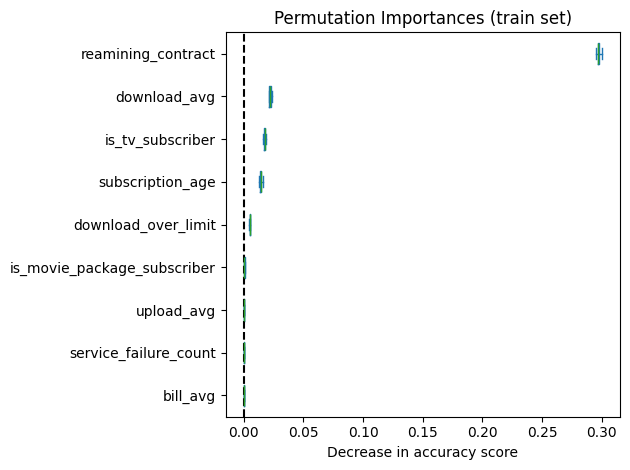

In [29]:
result = permutation_importance(
    logreg_model, X_train, y_train, n_repeats=10, random_state=42, n_jobs=2
)

sorted_importances_idx = result.importances_mean.argsort()
importances = pd.DataFrame(
    result.importances[sorted_importances_idx].T,
    columns=X.columns[sorted_importances_idx],
)
ax = importances.plot.box(vert=False, whis=10)
ax.set_title("Permutation Importances (train set)")
ax.axvline(x=0, color="k", linestyle="--")
ax.set_xlabel("Decrease in accuracy score")
ax.figure.tight_layout()

In [ ]:
#SVM
from sklearn.model_selection import GridSearchCV
from sklearn.svm import SVC

# словник парметрів для перебору
# 'С' залишив всього до 1, бо при 10 з ядром poly компьютерер впадав вже в дууужедовгі розрахунки, після 10 хвилин очікування скасовува операції
# 'gamma' виріши вне ставити дефолтним 1/n фіч, а вірішиі подивитись граничні , і більш менші
param_grid = {
    'C': [0.1, 1],
    'gamma': [1, 0.1, 0.01, 0.001], # np.linspace(0, 1, 6),
    'kernel': ['linear', 'rbf', 'poly', 'sigmoid']
}

# Create a GridSearchCV object
grid = GridSearchCV(SVC(), param_grid, refit=True, verbose=3)

# Fit the GridSearchCV object to the data
grid.fit(X_log_train, y_log_train)

Fitting 5 folds for each of 32 candidates, totalling 160 fits
[CV 1/5] END .....C=0.1, gamma=1, kernel=linear;, score=0.868 total time= 6.4min
[CV 2/5] END .....C=0.1, gamma=1, kernel=linear;, score=0.864 total time= 8.6min


<Axes: >

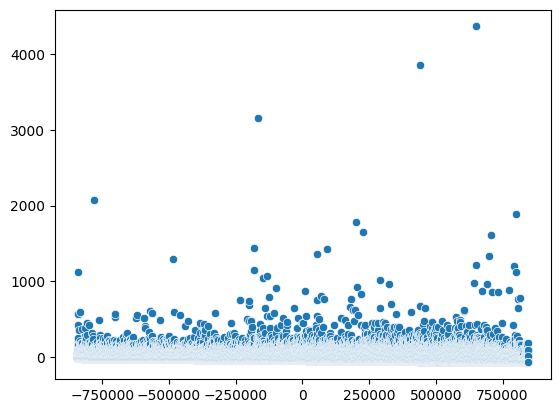

In [9]:
# кількість ознак просто неописуєма! 785 карл!, ніби щось з бази даних рукописних символів. щож, зменшим їх до двох як рекомендує умова ДЗ
from sklearn.decomposition import PCA

num_components = 4
pca = PCA(n_components=num_components)
X_pca = pca.fit_transform(data_min[0:-1])

# Візуалізуємо отримані дані
sns.scatterplot(x=X_pca[:, 0], y=X_pca[:, 1])